<link href="https://fonts.googleapis.com/css2?family=Nunito&display=swap" rel="stylesheet">

<div style="background-color:white; text-align:center; padding:30px, sans-serif;">
    <h2 style="color:black; margin-bottom: 5px;"><strong>EcoSage</strong></h2>
    <h3 style="color:gray; font-weight:normal; margin-top: 0;">Exploratory Data Analysis on the Data</h3>
    <table style="margin: 20px auto 0; border-collapse: collapse; width: 60%; sans-serif; font-size: 16px;">
        <thead>
            <tr style="background-color: #f2f2f2;">
                <th style="padding: 12px; border-bottom: 1px solid #ddd; text-align: center;">Name</th>
                <th style="padding: 12px; border-bottom: 1px solid #ddd; text-align: center;">GitHub Username</th>
            </tr>
        </thead>
        <tbody>
            <tr>
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">Vince Ammerlaan</td>
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">Vince16270</td>
            </tr>
            <tr style="background-color: #f9f9f9;">
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">Tommi Lander</td>
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">Tommi7</td>
            </tr>
            <tr>
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">Nima Ghafar</td>
                <td style="padding: 10px; border-bottom: 1px solid #ddd; text-align: center;">NimaGhafar</td>
            </tr>
            <tr style="background-color: #f9f9f9;">
                <td style="padding: 10px; text-align: center;">Jort Akershoek</td>
                <td style="padding: 10px; text-align: center;">JortAkershoek</td>
            </tr>
        </tbody>
    </table>

</div>

<div style="display: flex; justify-content: center; align-items: center; margin-top:20px;">
    <img src="https://static.vecteezy.com/system/resources/previews/017/306/579/original/esg-sustainability-concept-illustration-vector.jpg" alt="genres" style="width: 600px; height: auto;">
</div>

- Client: Mathis Mourey 
- Instructors: Mirabai Vosteen and Beata Skuczynska
- Date: 15-06-2025

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> Table of contents </strong></h2>
</div>
<ul style="padding: 0; list-style: none;">
    <li style="text-align: center;"><a href="#1.0">Chapter 1: The Project</a></li>
    <li style="text-align: center;"><a href="#1.0">Chapter 2: Loading Packages, Self-defined functions and the Data</a></li>
    <li style="text-align: center;"><a href="#2.0">Chapter 3: Exploratory Data Analysis</a></li>
</ul>

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> Chapter 1: The Project </strong></h2>

</ul>

In this project, we focus on improving the accessibility of policy information related to the energy transition. Governments across Europe and the Netherlands publish numerous policy documents, regulations, and reports to support the shift toward renewable energy sources. These documents are often technical, extensive, and written in academic or legal language, making it difficult for citizens to understand their content. As a result, they miss out on important information about subsidies, regulations, or their own role in the energy transition.

To address this problem, we are developing a chatbot powered by a Large Language Model (LLM). This chatbot is capable of automatically analyzing, summarizing, and translating government documents into plain and understandable language. Users can ask questions through a simple interface, and the chatbot provides clear answers based on factual information.

Our approach consists of collecting policy documents in PDF format, preprocessing the texts using NLP techniques such as tokenization and filtering, and leveraging a powerful pretrained LLM for text processing. Instead of training a model from scratch, we utilize a pretrained model and Retrieval-Augmented Generation (RAG) to generate relevant answers. The generated responses are evaluated based on their clarity, relevance, and reliability.

With this tool, we aim to contribute to a better-informed society in which citizens have easy access to simplified yet essential information. In doing so, we not only increase public engagement in the energy transition, but also strengthen support for sustainable policy.

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> Chapter 2: Loading Packages, Self-defined functions and the Data</strong></h2>

</ul>

**Packages**

- This section of the notebook covers the necessary Python packages required for our deep learning models. Below is a list of the key packages used

In [7]:
import os
import re
import math
import nltk
import json
import torch
import faiss
import string
import requests
import textwrap
import numpy as np
import pandas as pd
import seaborn as sns
from PyPDF2 import PdfReader
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import LatentDirichletAllocation, PCA
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM, AutoModelForCausalLM
from accelerate import init_empty_weights, load_checkpoint_and_dispatch

**Self defined functions**

- This section contains our self defined functions that are essential for our project. These functions are written to streamline repetitive tasks and enhance code readability.

In [8]:
def extract_text_from_pdf(pdf_path):
    try:
        reader = PdfReader(pdf_path)
        text = ""
        for page in reader.pages:
            text += page.extract_text()
        return text
    except Exception as e:
        print(f"Error reading {pdf_path}: {e}")
        return None

In [9]:
def count_stopwords(text):
    words = text.split()
    stopword_count = sum(1 for word in words if word.lower() in stop_words)
    return stopword_count

In [10]:
def clean_text(text):
    text = re.sub(r'\s+', ' ', text) 
    text = re.sub(r'[^\w\s.,!?]', '', text)
    text = text.strip()
    return text

In [11]:
def chunk_text(text, max_tokens, tokenizer):
    tokens = tokenizer.tokenize(text)
    chunks = []
    for i in range(0, len(tokens), max_tokens):
        chunk = tokens[i:i + max_tokens]
        chunks.append(tokenizer.convert_tokens_to_string(chunk))
    return chunks

In [ ]:
def remove_stopwords(text):
    return ' '.join([word for word in text.split() if word not in stop_words])

NameError: name 'df' is not defined

In [13]:
def show_topics(model, fnames, topn=10):
    for i, comp in enumerate(model.components_):
        terms = ", ".join(fnames[j] for j in comp.argsort()[-topn:][::-1])
        print(f"\nTopic {i+1}: {terms}")

**Loading the text from the PDF files**

- Here we load the text from the different PDF files into text format.

In [14]:
pdf_dir = os.path.join("..", "data")

data = []
for file_name in os.listdir(pdf_dir):
    if file_name.endswith(".pdf"):
        file_path = os.path.join(pdf_dir, file_name)
        text = extract_text_from_pdf(file_path)
        if text:
            data.append({"file_name": file_name, "text": text})

df = pd.DataFrame(data)

In [ ]:
df['word_count'] = df['text'].apply(lambda x: len(x.split()))
df['stopword_count'] = df['text'].apply(count_stopwords)
df['word_count'] = df['text'].apply(lambda x: len(x.split()))
df['stopword_percentage'] = df['stopword_count'] / df['word_count'] * 100
df['text_length'] = df['text'].apply(len)
df['no_stopwords'] = df['text'].apply(remove_stopwords)

---
<div style="background-color:white; text-align:center; vertical-align:middle; padding:50px 0; margin-top:5px; margin-bottom:5px">
    <h2 id="eda-title" style="color:black; font-family: Verdana, sans-serif; font-size: 25px;"><strong> Chapter 3: Exploratory Data Analysis </strong></h2>
</div>

**Basic Information**

In this section, we perform Exploratory Data Analysis (EDA). We check how many PDF files we have and look at different statistics. We also create word clouds and apply LDA to find topic groups. This helps us understand the structure of the data, discover patterns, and spot any unusual values.

In [15]:
print("Number of PDF files processed:", len(df))
print("Sample data:")
print(df.head())

Number of PDF files processed: 74
Sample data:
                                           file_name  \
0  EU Governance Regulation for Energy Union and ...   
1    Europe's sustainability transitions outlook.pdf   
2                       Natuur en biodiversiteit.pdf   
3                                     gezondheid.pdf   
4       Is er tijdens droogte genoeg drinkwater_.pdf   

                                                text  
0  This text is meant purely as a documentation t...  
1  EEA Report 06/2024Europe's sustainability tran...  
2  Beleid\n \nvoor\n \nnatuur\n \nen\n \nbiodiver...  
3  Gezonde\n \nleefstijl\n \nDe\n \nRijksoverheid...  
4   \nIs\n \ner\n \ntijdens\n \ndroogte\n \ngenoe...  


**Stopwoord-analysis**

In this section, we calculate text-related statistics for each PDF to help analyze the documents better.

- `word_count`: Counts the total number of words in the text.
- `stopword_count`: Counts how many of those words are stopwords (like: *de, het, en, the, and*).
- `stopword_percentage`: Calculates what percentage of the total words are stopwords.
- `text_length`: Counts the number of characters in the text.
- `no_stopwords`: Creates a version of the text with all stopwords removed. This is useful for clean wordclouds and topic modeling.

In [16]:
nltk.download('stopwords')

custom_stopwords = {
    'De', 'e', 'uitgangspunt', 'geplaatst', 'bijlage', 'en', 'Voor', 'bijvoorbeeld', 'Een', 
    'Article', 'Ik', 'wel', 'vragen', 'mensen', 'klanten', 'waarom', 'alleen', 'willen', 
    'niet', 'Ze', 'including', 'medewerker', 'Het', 'vaak', 'geven', 'zien', 'Dat', 'komt', 
    'gewoon', 'producten', 'Atlas', 'TrueTalk', 'Wat', 'nodig', 'per', 'zie figuur', 
    'Ook', 'minder', 'Daarnaast', 'weten', 'wij', 'waar', 'Deze', 'Dit',
    'Al', 'verschillende', 'zoals', 'doen', 'gaan', 'moeten', 'heel', 'mogelijk'} 

stop_words = set(stopwords.words('english')) | set(stopwords.words('dutch')) | custom_stopwords

display(df.head())

[nltk_data] Downloading package stopwords to /Users/vince/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,file_name,text
0,EU Governance Regulation for Energy Union and ...,This text is meant purely as a documentation t...
1,Europe's sustainability transitions outlook.pdf,EEA Report 06/2024Europe's sustainability tran...
2,Natuur en biodiversiteit.pdf,Beleid\n \nvoor\n \nnatuur\n \nen\n \nbiodiver...
3,gezondheid.pdf,Gezonde\n \nleefstijl\n \nDe\n \nRijksoverheid...
4,Is er tijdens droogte genoeg drinkwater_.pdf,\nIs\n \ner\n \ntijdens\n \ndroogte\n \ngenoe...


**Text lengths**

- In this section, we check the lengths of the different PDF's. The text length is the amount letters used in a PDF.

/var/folders/mb/k89l7lfd07lb5zsng_4khpw80000gn/T/ipykernel_49290/301593268.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='short_file_name', y='text_length', data=df_plot, palette='viridis')


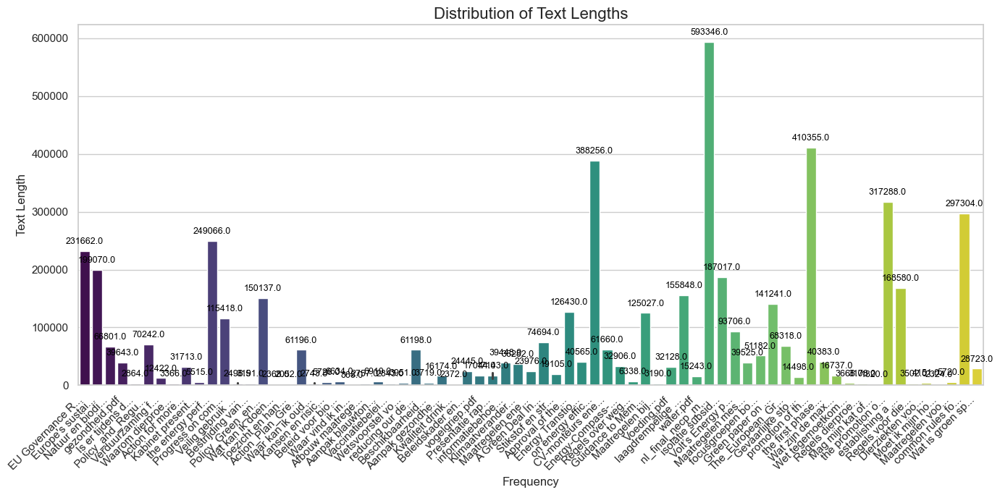

In [26]:
df['word_count'] = df['text'].apply(lambda x: len(x.split()))
df['stopword_count'] = df['text'].apply(count_stopwords)
df['word_count'] = df['text'].apply(lambda x: len(x.split()))
df['stopword_percentage'] = df['stopword_count'] / df['word_count'] * 100
df['text_length'] = df['text'].apply(len)
df['no_stopwords'] = df['text'].apply(remove_stopwords)

df_plot = df.copy()

df_plot['short_file_name'] = df_plot['file_name'].apply(lambda x: x[:15] + '...' if len(x) > 15 else x)

sns.set(style="whitegrid")
plt.figure(figsize=(14, 7))
ax = sns.barplot(x='short_file_name', y='text_length', data=df_plot, palette='viridis')

plt.xticks(rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.1f}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom',
                fontsize=9, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.title('Distribution of Text Lengths', fontsize=16)
plt.ylabel('Text Length', fontsize=12)
plt.xlabel('Frequency', fontsize=12)

plt.tight_layout()
plt.show()


**Stop words for each PDF file**

- In this section, we check the percentage of the stopwords for each PDF.

/var/folders/mb/k89l7lfd07lb5zsng_4khpw80000gn/T/ipykernel_49290/2238696426.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='short_file_name', y='stopword_percentage', data=df_plot, palette='viridis')


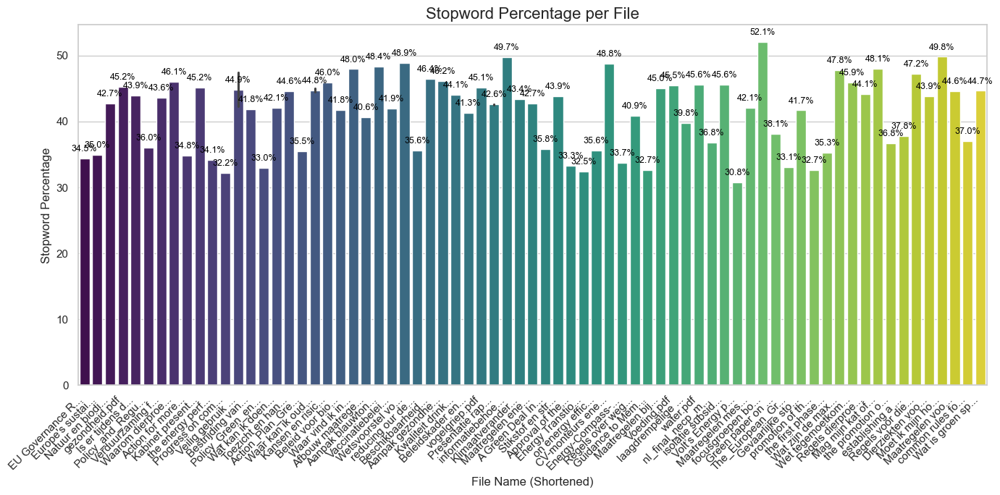

In [27]:
sns.set(style="whitegrid")
plt.figure(figsize=(14, 7))
ax = sns.barplot(x='short_file_name', y='stopword_percentage', data=df_plot, palette='viridis')

plt.xticks(rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.1f}%',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom',
                fontsize=9, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.title('Stopword Percentage per File', fontsize=16)
plt.ylabel('Stopword Percentage', fontsize=12)
plt.xlabel('File Name (Shortened)', fontsize=12)

plt.tight_layout()
plt.show()

**Word cloud**

- In this section, we check the word clouds. In the word clouds you can see which word is used the most and gives us a better insight in the PDF's.

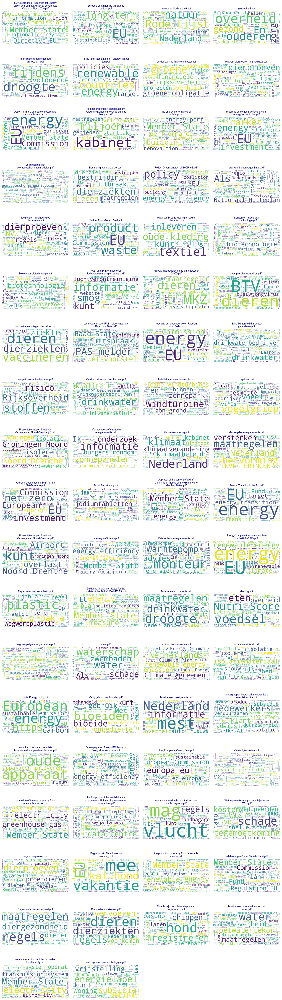

In [28]:
max_cols      = 4                         
aspect_ratio  = 4/3                       
title_width   = 38                        
wc_kwargs     = dict(                      
    width            = 600,
    height           = 300,
    background_color = "white",
    colormap         = "viridis",
    max_words        = 150,
    contour_color    = "black",
    contour_width    = 1.2,
)

n_files = len(df)
cols    = min(max_cols, n_files)
rows    = math.ceil(n_files / cols)

fig_w   = cols * 4                    
fig_h   = rows * (fig_w / cols) / aspect_ratio
fig, axes = plt.subplots(rows, cols,
                         figsize=(fig_w, fig_h),
                         squeeze=False)

for ax, (_, row) in zip(axes.ravel(), df.iterrows()):
    wc = WordCloud(**wc_kwargs).generate(row["no_stopwords"])
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")

    title = textwrap.fill(row["file_name"], width=title_width)
    ax.set_title(title, fontsize=10, color="navy", pad=6)

for ax in axes.ravel()[n_files:]:
    ax.remove()

plt.tight_layout()
plt.show()

We save the DataFrame for further processing

In [17]:
output_path = "processed_data.csv"
df.to_csv(output_path, index=False)
print(f"Processed data saved to {output_path}")

Processed data saved to processed_data.csv


We remove strange characters and unnecessary whitespace. Many policy documents contain unusual characters or formatting. Cleaning the input improves chunking and embedding quality.

After that, we split long texts into smaller pieces (chunks) of up to max_tokens tokens, so they fit within the context window of a language model.
Many LLMs have token limits, and chunking ensures we stay within those boundaries.

Blog, D. C. (2025, February 27). 5 Approaches to solve LLM token Limits | DeepChecks. Deepchecks. https://www.deepchecks.com/5-approaches-to-solve-llm-token-limits/

We load a tokenizer (GPT-2 in this case) and set the maximum number of tokens per chunk.

In [18]:
tokenizer_name = "gpt2"  
tokenizer = AutoTokenizer.from_pretrained(tokenizer_name)
max_tokens = 512

We apply _clean_text_ and _chunk_text_ to each row in the DataFrame.

After that, we save all chunks in JSONL format, where each line represents one sample (chunk).

In [19]:
data =[]
for i, row in df.iterrows():
    text = row['text']
    text = clean_text(text)
    chunks = chunk_text(text, max_tokens, tokenizer)
    for i, chunk in enumerate(chunks):
        data.append({'file_name': row['file_name'], 'chunk_id': i, 'text': chunk})
        
if 'clean_text' not in df.columns:
    df['clean_text'] = df['text'].apply(clean_text) 

df_processed = pd.DataFrame(data)
output_path = "processed_data_chunks.json"
df_processed.to_json(output_path, orient='records', lines=True)
print(f"Processed data saved to {output_path}")

Token indices sequence length is longer than the specified maximum sequence length for this model (44382 > 1024). Running this sequence through the model will result in indexing errors


Processed data saved to processed_data_chunks.json



Topic 1: het, een, van, voor, je, te, op, dat, met, zijn

Topic 2: energy, member, states, measures, union, national, directive, european, eu, regulation

Topic 3: european, eu, sustainability, climate, environmental, commission, policy, action, longterm, energy

Topic 4: energy, climate, eu, policy, 2030, gas, electricity, efficiency, renewable, european

Topic 5: energy, member, renewable, states, directive, emissions, building, gas, european, buildings


/var/folders/mb/k89l7lfd07lb5zsng_4khpw80000gn/T/ipykernel_17598/4144454686.py:39: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  plt.tight_layout(); plt.show()
/Users/vince/tensorflow-env/tensorflow/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


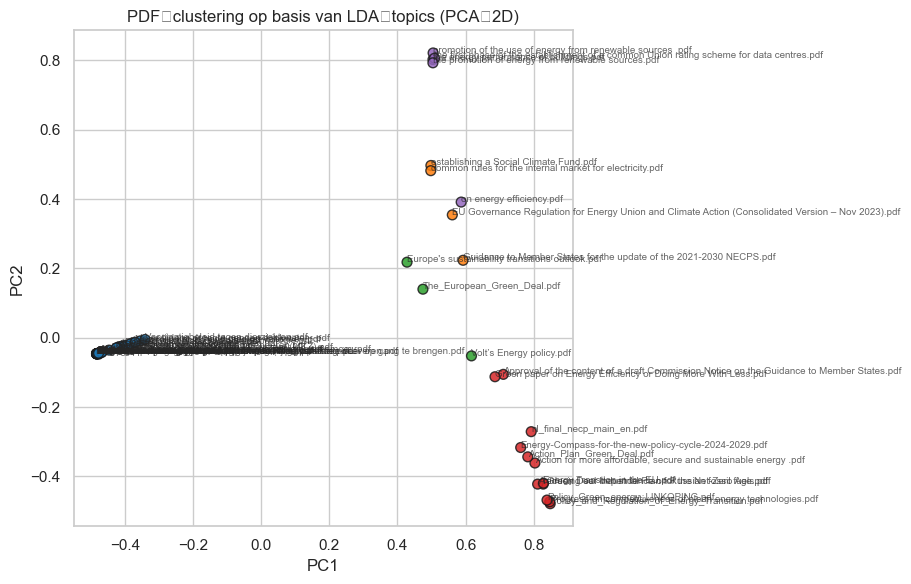

In [ ]:
custom_stop = {
    'shall', 'article', 'oj', 'ed',
    'author', 'paragraph', 'subparagraph', 'referred'}

stop_words = list(ENGLISH_STOP_WORDS.union(custom_stop))

vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words=stop_words)
doc_term_matrix = vectorizer.fit_transform(df['clean_text'])   

n_topics = 5
lda = LatentDirichletAllocation(
    n_components=n_topics,
    random_state=42,
    learning_method='batch'
).fit(doc_term_matrix)

feature_names = vectorizer.get_feature_names_out()
show_topics(lda, feature_names)

doc_topics = lda.transform(doc_term_matrix)
coords = PCA(n_components=2, random_state=42).fit_transform(doc_topics)

dom_topic = doc_topics.argmax(axis=1)
colors = plt.cm.tab10(dom_topic)

plt.figure(figsize=(9, 6))
plt.scatter(coords[:, 0], coords[:, 1], c=colors, s=50, alpha=0.85, edgecolors="k")

for i, fname in enumerate(df['file_name']):
    plt.annotate(fname, (coords[i, 0], coords[i, 1]), fontsize=7, alpha=0.7)

plt.title("PDF‑clustering op basis van LDA‑topics (PCA‑2D)")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.tight_layout(); plt.show()

Here, we load the chunks into a DataFrame.

In [21]:
df_chunks = pd.read_json("processed_data_chunks.json", lines=True)

print(df_chunks.head())

                                           file_name  chunk_id  \
0  EU Governance Regulation for Energy Union and ...         0   
1  EU Governance Regulation for Energy Union and ...         1   
2  EU Governance Regulation for Energy Union and ...         2   
3  EU Governance Regulation for Energy Union and ...         3   
4  EU Governance Regulation for Energy Union and ...         4   

                                                text  
0  This text is meant purely as a documentation t...  
1   Directives 2009119EC and EU 2015652 and repea...  
2   and e research, innovation and competitivenes...  
3   measures that have been adopted and implement...  
4   s compiled with the purpose of ensuring data ...  


We create a list of chunks containing only the text content from each JSON object. This is simple and quickly usable for embeddings.

In [22]:
with open("processed_data_chunks.json", "r") as f:
    chunks_data = [json.loads(line) for line in f]

chunks = [items['text'] for items in chunks_data]

We create embeddings from your chunks using a small, efficient model.

Why MiniLM?
- Small → runs on a CPU or regular laptop
- Fast → good enough for prototyping


sentence-transformers/all-MiniLM-L6-v2 · Hugging Face. (2024, January 5). https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2

In [19]:
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')
chunks_embeddings = embedding_model.encode(chunks, show_progress_bar=True)

Batches:   0%|          | 0/25 [00:00<?, ?it/s]

c:\Users\akers\anaconda3\envs\tf\lib\site-packages\transformers\models\bert\modeling_bert.py:440: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


What does it do?
- Initializes a FAISS index for fast vector searches
- Adds chunk embeddings to the index

Why?
- FAISS enables real-time retrieval of relevant chunks for RAG (Retrieval-Augmented Generation).

In [20]:
embedding_dim = chunks_embeddings[0].shape[0]
index = faiss.IndexFlatL2(embedding_dim)
index.add(np.array(chunks_embeddings).astype('float32'))

What does it do?
1. Embeds your question
2. Retrieves the top 5 most similar chunks
3. Combines them into context for your LLM

Why?
- By providing the LLM with only relevant context, you get better answers to your questions.

Why top_k = 5?
- It’s a balance between enough context and not too many tokens. You can fine-tune this value.

In [21]:
user_question = "What is the green deal"
question_embedding = embedding_model.encode([user_question])

In [22]:
top_k = 5
_, indices = index.search(np.array(question_embedding).astype('float32'), top_k)
retreived_chunks = [chunks[i] for i in indices[0]]
context = "\n\n".join(retreived_chunks)